In [1]:
import numpy as np
import cv2 as cv
import mediapipe as mp
import matplotlib.pyplot as plt
from pathlib import Path

In [2]:
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles
mp_hands = mp.solutions.hands

<h2>MediaPipe by Google</h2>

Getting started: https://google.github.io/mediapipe/getting_started/python.html

Handmark: https://google.github.io/mediapipe/solutions/hands

To install, use

    pip install mediapipe
    
This may automatically install OpenCV if you haven't already, as it's a required dependency. If it wants you to do it manually, use

    pip install opencv-python

If you're using Anaconda, do this from a command prompt with your python environment active.
    
The script below is given on the webpage above (as well as corresponding code for working with video capture). In initial tests with the ur-garg dataset (320x240, colour) mpHands was running on a single CPU core, which was enough to give me 21.2fps. In the 1680 frames in this dataset, with the given confidence threshold it failed to detect only one hand, user_10/C1.jpg. In every other case, to judge by a scan of the file thumbnails, it correctly placed all its landmarks.

Handedness: [classification {
  index: 0
  score: 0.9979398
  label: "Left"
}
, classification {
  index: 1
  score: 0.9926609
  label: "Right"
}
]


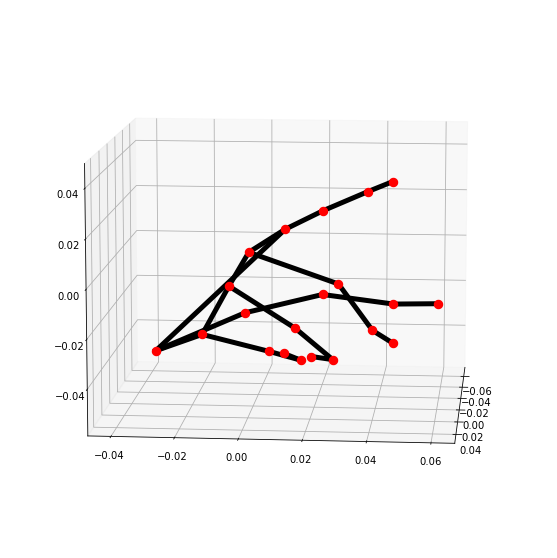

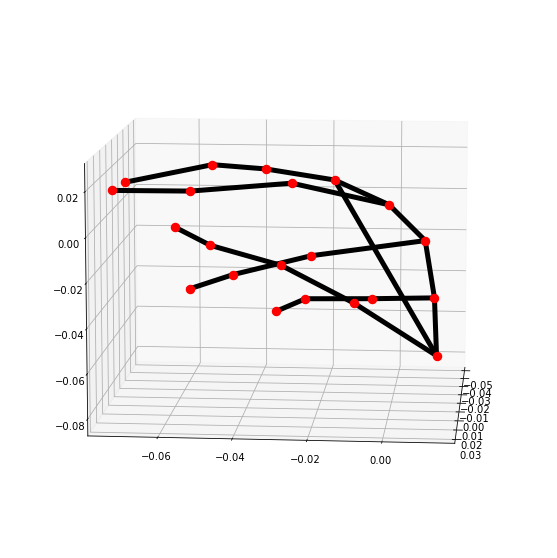

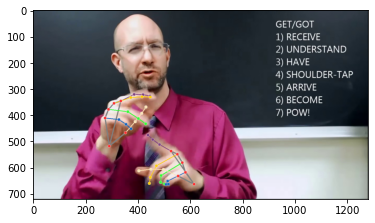

In [14]:
# script by google

# populate this list with strings giving the relative paths of your chosen images
IMAGE_FILES = ["temp/0001.jpg"]

hands = mp_hands.Hands(static_image_mode=True,
                        max_num_hands=2,
                        min_detection_confidence=0.5)

for idx, file in enumerate(IMAGE_FILES):
    # mpHands expects images to come reversed, like a selfie in a mirror. As far as I can see this matters only
    # for its labelling of handedness.
    image = cv.flip(cv.imread(file), 1)
    results = hands.process(cv.cvtColor(image, cv.COLOR_BGR2RGB))   #OpenCV uses BGR by default, mpHands wants RGB

    # Print handedness and draw hand landmarks on the image.
    print('Handedness:', results.multi_handedness)
    if not results.multi_hand_landmarks:
        print("Hand not detected: " + file)
        continue
    image_height, image_width, _ = image.shape
    annotated_image = image.copy()
    
    for hand_landmarks in results.multi_hand_landmarks:
        # this section prints out the position of each hand landmark, if you want to know them
        #print('hand_landmarks:', hand_landmarks)        
        #print(
        #     f'Index finger tip coordinates: (',
        #     f'{hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_TIP].x * image_width}, '
        #     f'{hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_TIP].y * image_height})'
        #    )
        mp_drawing.draw_landmarks(
          annotated_image,
          hand_landmarks,
          mp_hands.HAND_CONNECTIONS,
          mp_drawing_styles.get_default_hand_landmarks_style(),
          mp_drawing_styles.get_default_hand_connections_style())
    # if you want to write the image to a file, this line will do it; the directory tmp/ needs to exist already.
    # cv.imwrite('/tmp/annotated_image' + str(idx) + '.png', cv.flip(annotated_image,1)
        
    if not results.multi_hand_world_landmarks:
         continue
    for hand_world_landmarks in results.multi_hand_world_landmarks:
        mp_drawing.plot_landmarks(
          hand_world_landmarks, mp_hands.HAND_CONNECTIONS, azimuth=5)
            
    plt.imshow(cv.cvtColor( cv.flip(annotated_image, 1), cv.COLOR_BGR2RGB))   # pyplot expects RGB too

In [28]:
results.multi_handedness[1].classification[0].label

'Right'

In [11]:
def clamp(x, y, size):
    x = max(0, min(x, size[1]))
    y = max(0, min(y, size[0]))
    return x,y

def get_bounding_box(landmark_values, image, pad_fraction = 0.2, pad_constant = 5):
    coord_list_x = []
    coord_list_y = []
    size = image.shape
    y_size, x_size, channels = size
    for landmark in landmark_values:
        coord_list_x.append(int(landmark.x * x_size))
        coord_list_y.append(int(landmark.y * y_size))
    x_min, x_max, y_min, y_max = min(coord_list_x), max(coord_list_x), min(coord_list_y), max(coord_list_y)
    x_pad, y_pad = pad_constant+int((x_max - x_min)*pad_fraction), pad_constant+int((y_max-y_min)*pad_fraction)
    top_left = clamp(x_min-x_pad, y_min-y_pad, size)
    bot_right = clamp(x_max+x_pad, y_max+y_pad, size)
    print(top_left, bot_right)
    return image[top_left[1]:bot_right[1], top_left[0]:bot_right[0]]

In [6]:
img = cv.imread("temp/0001.jpg")

In [12]:
res = get_bounding_box(results.multi_hand_landmarks[0].landmark._values, img)

(617, 434) (922, 706)


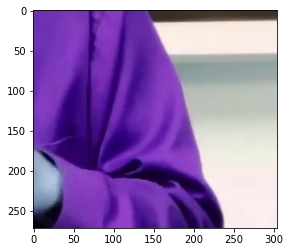

In [13]:
plt.imshow(res)

In [60]:
image = cv.flip(cv.imread(file), 1)

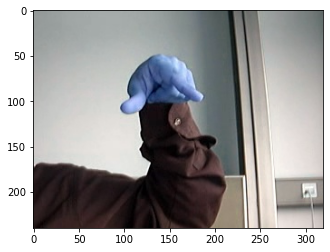

In [35]:
plt.imshow(image)

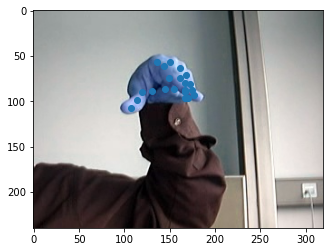

In [36]:
plt.imshow(image)
plt.scatter(coord_list_x, coord_list_y)

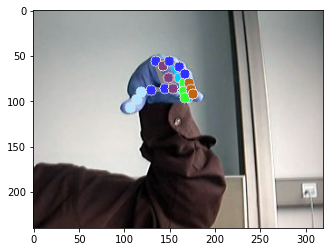

In [37]:
plt.imshow(annotated_image)

In [84]:
def clip_to_size(x, y, size):
    x = max(0, min(x, size[1]))
    y = max(0, min(y, size[0]))
    return x,y

def get_bounding_box(results, image, pad_fraction = 0.2, pad_constant = 5):
    coord_list_x = []
    coord_list_y = []
    size = image.shape
    y_size, x_size, channels = size
    for landmark in results.multi_hand_landmarks[0].landmark._values:
        coord_list_x.append(int(landmark.x * x_size))
        coord_list_y.append(int(landmark.y * y_size))
    x_min, x_max, y_min, y_max = min(coord_list_x), max(coord_list_x), min(coord_list_y), max(coord_list_y)
    x_pad, y_pad = pad_constant+int((x_max - x_min)*pad_fraction), pad_constant+int((y_max-y_min)*pad_fraction)
    top_left = clip_to_size(x_min-x_pad, y_min-y_pad, size)
    bot_right = clip_to_size(x_max+x_pad, y_max+y_pad, size)
    print(top_left, bot_right)
    return image[top_left[1]:bot_right[1], top_left[0]:bot_right[0]]

(89, 41) (194, 122)


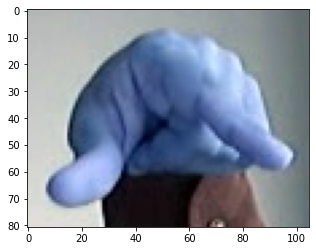

In [85]:
plt.imshow(get_bounding_box(results, image))

In [52]:
x_min, x_max, y_min, y_max = min(coord_list_x), max(coord_list_x), min(coord_list_y), max(coord_list_y)

In [80]:
image.shape

(240, 320, 3)

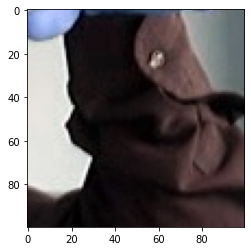

In [83]:
plt.imshow(image[100:200, 100:200])

In [62]:
# clip this to image dims, x in [0,320] and y in [0,240]
# add in 1% of image dims to pad?
x_pad, y_pad = 5+int((x_max - x_min)*.2), 5+int((y_max-y_min)*.2)

In [77]:
x_min, x_max, y_min, y_max

(107, 176, 56, 107)

In [64]:
image.shape

(240, 320, 3)

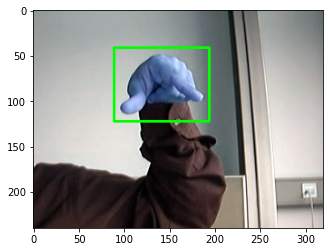

In [63]:
#cv.rectangle(img,(384,0),(510,128),(0,255,0),3)
#top-left, bottom-right, colour, thickness
img_temp = image.copy()
plt.imshow(cv.rectangle(img_temp, (x_min-x_pad, y_min-y_pad), (x_max+x_pad, y_max+y_pad), (0,255,0), 2))

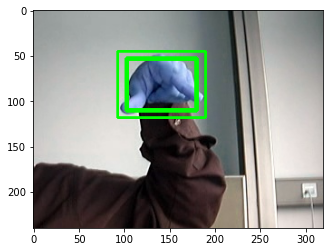

In [59]:
plt.imshow(image)

In [19]:
cap = cv.VideoCapture(0)

In [5]:
while cap.isOpened():
    success, image = cap.read()
    if not success:
        print("Ignoring empty camera frame.")
        # If loading a video, use 'break' instead of 'continue'.
        continue
    cv.imshow('MediaPipe Hands', cv.flip(image, 1))
    if cv.waitKey(5) & 0xFF == 27:
        break
        

cv.destroyAllWindows()

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty camera frame.
Ignoring empty

KeyboardInterrupt: 

In [38]:
import concurrent.futures

In [8]:
queue = concurrent.futures.ProcessPoolExecutor()
hands = mp_hands.Hands(model_complexity=0,
                        min_detection_confidence=0.5,
                        min_tracking_confidence=0.5)

In [9]:
image = cv.imread("temp/q9.jpg")

In [12]:
hands_calc = queue.submit(hands.process, image)

In [15]:
hands_calc.exception()

TypeError("cannot pickle 'mediapipe.python._framework_bindings.calculator_graph.CalculatorGraph' object")

In [18]:
fig = plt.figure(figsize=(4, 4))
fig.dpi

72.0

<Figure size 288x288 with 0 Axes>

In [27]:
dir(fig)

['_PROPERTIES_EXCLUDED_FROM_SET',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_add_axes_internal',
 '_agg_filter',
 '_align_label_groups',
 '_alpha',
 '_animated',
 '_axobservers',
 '_axstack',
 '_button_pick_id',
 '_cachedRenderer',
 '_callbacks',
 '_canvas_callbacks',
 '_clipon',
 '_clippath',
 '_cm_set',
 '_constrained',
 '_constrained_layout_pads',
 '_default_contains',
 '_dpi',
 '_gci',
 '_get_clipping_extent_bbox',
 '_get_dpi',
 '_get_draw_artists',
 '_gid',
 '_gridspecs',
 '_in_layout',
 '_label',
 '_localaxes',
 '_mouseover',
 '_normalize_grid_string',
 '_original_dpi',
 '_path_effects',
 '_picker',
 '_process_projection_r

In [30]:
fig.draw(fig.canvas.get_renderer())

In [41]:
fig.__dict__

{'_stale': True,
 'stale_callback': None,
 'figure': <Figure size 288x288 with 1 Axes>,
 '_transform': None,
 '_transformSet': False,
 '_visible': True,
 '_animated': False,
 '_alpha': None,
 'clipbox': None,
 '_clippath': None,
 '_clipon': True,
 '_label': '',
 '_picker': None,
 '_rasterized': False,
 '_agg_filter': None,
 '_mouseover': False,
 '_callbacks': <matplotlib.cbook.CallbackRegistry at 0x13c073bc4c0>,
 '_remove_method': None,
 '_url': None,
 '_gid': None,
 '_snap': None,
 '_sketch': None,
 '_path_effects': [],
 '_sticky_edges': _XYPair(x=[], y=[]),
 '_in_layout': True,
 '_suptitle': None,
 '_supxlabel': None,
 '_supylabel': None,
 '_align_label_groups': {'x': <matplotlib.cbook.Grouper at 0x13c073bc7f0>,
  'y': <matplotlib.cbook.Grouper at 0x13c073bc850>},
 '_gridspecs': [],
 '_localaxes': <matplotlib.figure._AxesStack at 0x13c073bcf70>,
 'artists': [],
 'lines': [],
 'patches': [],
 'texts': [],
 'images': [],
 'legends': [],
 'subfigs': [],
 'suppressComposite': None,
 'cal

In [33]:
def hands_process(hands, image):
    return hands.process(image)

In [35]:
def fig_draw(fig):
    fig.draw(fig.canvas.get_renderer())

TypeError: cannot pickle 'mediapipe.python._framework_bindings.calculator_graph.CalculatorGraph' object

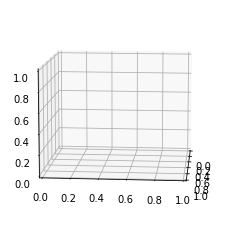

In [40]:
# script by google for video/webcam input

queue = concurrent.futures.ProcessPoolExecutor()
hands = mp_hands.Hands(model_complexity=0,
                        min_detection_confidence=0.5,
                        min_tracking_confidence=0.5)
#handmarks = []
#conn = []


fig = plt.figure(figsize=(4, 4))
ax = plt.axes(projection='3d')
ax.view_init(elev=10, azim=5)


#anim = matplotlib.animation.FuncAnimation(fig, update_landmarks_plot, (handmarks,conn), interval=20)

fig_w, fig_h = fig.canvas.get_width_height()

while cap.isOpened():
    if cv.waitKey(5) & 0xFF == 27:
        break
    success, image = cap.read()
    if not success:
        print("Ignoring empty camera frame.")
        # If loading a video, use 'break' instead of 'continue'.
        continue

    # To improve performance, optionally mark the image as not writeable to
    # pass by reference.
    image.flags.writeable = False
    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    
    processing_hands = queue.submit(hands_process, hands, image)
    drawing_figure = queue.submit(fig_draw, fig)
    #results = hands.process(image)

    # Draw the hand annotations on the image.
    image.flags.writeable = True
    image = cv.cvtColor(image, cv.COLOR_RGB2BGR)
    concurrent.futures.wait([processing_hands])
    results = processing_hands.result()
    
    if results.multi_hand_landmarks:
        hand_landmarks = results.multi_hand_landmarks[0]
        mp_drawing.draw_landmarks( image,
                hand_landmarks,
                mp_hands.HAND_CONNECTIONS,
                mp_drawing_styles.get_default_hand_landmarks_style(),
                mp_drawing_styles.get_default_hand_connections_style())

    if results.multi_hand_world_landmarks:
        hand_world_landmarks = results.multi_hand_world_landmarks[0]
        update_landmarks_plot(hand_world_landmarks,
                        mp_hands.HAND_CONNECTIONS    
                         )
            #mp_drawing.plot_landmarks(
            #    hand_world_landmarks, mp_hands.HAND_CONNECTIONS, azimuth=5)
    #fig.draw(fig.canvas.get_renderer())
    if drawing_figure.done():
        skeleton_image = np.frombuffer(fig.canvas.tostring_rgb(), np.uint8).reshape((fig_w, fig_h, 3))
        cv.imshow('Skeleton Model', skeleton_image)
    cv.imshow('MediaPipe Hands', cv.flip(image, 1))
        

cv.destroyAllWindows()

In [21]:
cv.destroyAllWindows()

In [168]:
cap.release()

In [148]:
fig.canvas.tostring_rgb()

b'\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x

In [94]:
thing1, thing2 = fig.canvas.print_to_buffer()

In [146]:
fig.canvas.get_width_height()

(720, 720)

In [38]:
cap.release()

In [35]:
def update_landmarks_plot(landmark_list,
                        axes,
                        connections    
                         ):
    if not landmark_list:
        return
    plotted_landmarks = {}
    for idx, landmark in enumerate(landmark_list.landmark):
        if ((landmark.HasField('visibility') and
             landmark.visibility < _VISIBILITY_THRESHOLD) or
            (landmark.HasField('presence') and
             landmark.presence < _PRESENCE_THRESHOLD)):
            continue
        axes.scatter3D(
            xs=[-landmark.z],
            ys=[landmark.x],
            zs=[-landmark.y],
            color=[(1,0,0)],
            linewidth=5)
        plotted_landmarks[idx] = (-landmark.z, landmark.x, -landmark.y)
    if connections:
        num_landmarks = len(landmark_list.landmark)
        # Draws the connections if the start and end landmarks are both visible.
        for connection in connections:
            start_idx = connection[0]
            end_idx = connection[1]
            if not (0 <= start_idx < num_landmarks and 0 <= end_idx < num_landmarks):
                raise ValueError(f'Landmark index is out of range. Invalid connection '
                         f'from landmark #{start_idx} to landmark #{end_idx}.')
            if start_idx in plotted_landmarks and end_idx in plotted_landmarks:
                landmark_pair = [
                    plotted_landmarks[start_idx], plotted_landmarks[end_idx]
                ]
                axes.plot3D(
                    xs=[landmark_pair[0][0], landmark_pair[1][0]],
                    ys=[landmark_pair[0][1], landmark_pair[1][1]],
                    zs=[landmark_pair[0][2], landmark_pair[1][2]],
                    color='black',
                    linewidth=5)

In [22]:
def update_landmarks_plot(landmark_list,
                   connections,
                   elevation: int = 10,
                   azimuth: int = 10):
    if not landmark_list:
        return
    ax = plt.axes(projection='3d')
    ax.view_init(elev=elevation, azim=azimuth)
    plotted_landmarks = {}
    for idx, landmark in enumerate(landmark_list.landmark):
        if ((landmark.HasField('visibility') and
             landmark.visibility < _VISIBILITY_THRESHOLD) or
            (landmark.HasField('presence') and
             landmark.presence < _PRESENCE_THRESHOLD)):
            continue
        ax.scatter3D(
            xs=[-landmark.z],
            ys=[landmark.x],
            zs=[-landmark.y],
            color=(1,0,0),
            linewidth=5)
        plotted_landmarks[idx] = (-landmark.z, landmark.x, -landmark.y)
    if connections:
        num_landmarks = len(landmark_list.landmark)
        # Draws the connections if the start and end landmarks are both visible.
        for connection in connections:
            start_idx = connection[0]
            end_idx = connection[1]
            if not (0 <= start_idx < num_landmarks and 0 <= end_idx < num_landmarks):
                raise ValueError(f'Landmark index is out of range. Invalid connection '
                         f'from landmark #{start_idx} to landmark #{end_idx}.')
            if start_idx in plotted_landmarks and end_idx in plotted_landmarks:
                landmark_pair = [
                    plotted_landmarks[start_idx], plotted_landmarks[end_idx]
                ]
                ax.plot3D(
                    xs=[landmark_pair[0][0], landmark_pair[1][0]],
                    ys=[landmark_pair[0][1], landmark_pair[1][1]],
                    zs=[landmark_pair[0][2], landmark_pair[1][2]],
                    color='black',
                    linewidth=5)

In [9]:
# script for batch processing a dataset which is in a folder with subfolders
# saves annotated images in temp/ with the same subfolder structure

datapath = "Dataset (ur-garg)/"

hands = mp_hands.Hands(static_image_mode=True,
                        max_num_hands=2,
                        min_detection_confidence=0.5)


e1 = cv.getTickCount()      #cv counts processor cycles, could use python time module instead
filecount = 0

for dir in Path(datapath).iterdir():
    Path("temp/").mkdir(exist_ok=True)
    Path("temp/" + dir.stem).mkdir(exist_ok=True)
    for file in dir.iterdir():
        if file.suffix != ".jpg":
            continue
        filepath = str(file)
        if not cv.haveImageReader(filepath):
            print("Could not load: " + filepath)
            continue
        filecount += 1
        image = cv.flip(cv.imread(filepath), 1)                      
        results = hands.process(cv.cvtColor(image, cv.COLOR_BGR2RGB))

        # Print handedness and draw hand landmarks on the image.
        #print('Handedness:', results.multi_handedness)
        if not results.multi_hand_landmarks:
            print("Hand not detected: " + filepath)
            continue
        image_height, image_width, _ = image.shape
        for hand_landmarks in results.multi_hand_landmarks:
            #print('hand_landmarks:', hand_landmarks)
            #print(
            #  f'Index finger tip coordinates: (',
            #  f'{hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_TIP].x * image_width}, '
            #  f'{hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_TIP].y * image_height})'
            #)
            mp_drawing.draw_landmarks(
              image,
              hand_landmarks,
              mp_hands.HAND_CONNECTIONS,
              mp_drawing_styles.get_default_hand_landmarks_style(),
              mp_drawing_styles.get_default_hand_connections_style())
        cv.imwrite("temp/"+ dir.stem +"/"+ file.name, image)
        # Draw hand world landmarks.
        #if not results.multi_hand_world_landmarks:
        #    continue
        #for hand_world_landmarks in results.multi_hand_world_landmarks:
        #    mp_drawing.plot_landmarks(
        #      hand_world_landmarks, mp_hands.HAND_CONNECTIONS, azimuth=5)
        
e2 = cv.getTickCount()
time = (e2 - e1)/ cv.getTickFrequency()
print("Elapsed time: " + str(time))
print("FPS: " + str(filecount/time))

Hand not detected: Dataset (ur-garg)\user_10\C1.jpg
Elapsed time: 79.1211622
FPS: 21.23325736486717


In [158]:
from concurrent.futures import ProcessPoolExecutor

In [159]:
queue = ProcessPoolExecutor()

In [165]:
results = queue.submit(cv.cvtColor, image, cv.COLOR_RGB2BGR)

In [167]:
results

<Future at 0x27c992b69d0 state=finished returned ndarray>

In [ ]:
# script by google for video/webcam input

hands = mp_hands.Hands(model_complexity=0,
                        min_detection_confidence=0.5,
                        min_tracking_confidence=0.5)
#handmarks = []
#conn = []


fig = plt.figure(figsize=(10, 10))
ax = plt.axes(projection='3d')
ax.view_init(elev=10, azim=5)


#anim = matplotlib.animation.FuncAnimation(fig, update_landmarks_plot, (handmarks,conn), interval=20)

fig_w, fig_h = fig.canvas.get_width_height()

while cap.isOpened():
    success, image = cap.read()
    if not success:
        print("Ignoring empty camera frame.")
        # If loading a video, use 'break' instead of 'continue'.
        continue

    # To improve performance, optionally mark the image as not writeable to
    # pass by reference.
    image.flags.writeable = False
    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    results = hands.process(image)

    # Draw the hand annotations on the image.
    image.flags.writeable = True
    image = cv.cvtColor(image, cv.COLOR_RGB2BGR)
    if results.multi_hand_landmarks:
        for hand_landmarks in results.multi_hand_landmarks:
            mp_drawing.draw_landmarks(
                image,
                hand_landmarks,
                mp_hands.HAND_CONNECTIONS,
                mp_drawing_styles.get_default_hand_landmarks_style(),
                mp_drawing_styles.get_default_hand_connections_style())
            
    # Flip the image horizontally for a selfie-view display.
    cv.imshow('MediaPipe Hands', cv.flip(image, 1))
    
    if results.multi_hand_world_landmarks:
        #handmarks = results.multi_hand_world_landmarks[0]
        #conn = mp_hands.HAND_CONNECTIONS
        for hand_world_landmarks in results.multi_hand_world_landmarks:
            update_landmarks_plot(hand_world_landmarks,
                        mp_hands.HAND_CONNECTIONS    
                         )
            #mp_drawing.plot_landmarks(
            #    hand_world_landmarks, mp_hands.HAND_CONNECTIONS, azimuth=5)
        plt.draw()
        skeleton_image = np.frombuffer(fig.canvas.tostring_rgb(), np.uint8).reshape((fig_w, fig_h, 3))
        cv.imshow('Skeleton Model', skeleton_image)
    if cv.waitKey(5) & 0xFF == 27:
        break
        

cv.destroyAllWindows()